#### Blackjack Final MAL2 Assignment
We have decided to go for reinforcement learning (Q_Learning_Agent, SARSA, Monte Carlo) and test it against so called 'perfect' strategy for blackjack (the most common game in casino).<br>
Since blackjack is a 'solved' game aka. there is a working strategy that reduces house edge to around 0.5% (if executed perfectly) we will test various approaches to get the highest winrate possible.<br>
Before diving in, we would like to explain few important aspects of our setup:<br>
- Prior knowledge about playing blackjack is required - we will not explain the rules and technicalities of the game here<br>
- We are using GymAI environment that is running on infite deck - the card that is dealt is immediately replaced.<br>
- Using said environment reduces available action space to 2 actions: <b>hit</b> and <b>stand</b> compared to the 'normal' game.<br>
- Above mentioned situation lowers the house edge from ~8% to ~2% at best (compared if we were able to use full action space (than house's edge would we reduced to 0.5%))<br>


Here is the overview of the different versions and training approaches we will be using (the in-depth explanation will be provided before implementation of each model):<br>
- v0.1 (Q_Learning_Agent)<br>
Clean env -> no incentives on strategy, either from rewards or actions<br>
- v0.2 Q_Learning_Agent)<br>
A reward system based on strategy, ie. game outcome reward is supplemented by incrementaly higher multiplier describing significance of following the strategy as part of the reward<br>
- v0.3 (Q_Learning_Agent)<br>
Action-based strategy<br>
- v0.4 (SARSA)<br>
State-Action-Reward-State-Action<, on-policy algorithm<br>
- v0.5 (Monte Carlo Policy Evaluation)<br>
 on-policy, epsilon-greedy, no strategy approach<br>

 We were testing most of our approaches on 10000 episodes, after confirming that everything works we were moving to 500_000 episodes to ensure enough data and reduce randomness.<br>

# Common Code Snippets
The following are code snippets that remain unchanged for most of the implementation regardless of version used.<br>

## Imports

In [44]:
import gymnasium as gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from collections import defaultdict
import matplotlib.gridspec as gridspec

## Environment

In [45]:
def create_environment(natural=False, sab=False):
    """
    Create and return a Blackjack-v1 environment.
    """
    env = gym.make("Blackjack-v1", natural=natural, sab=sab)
    return env

## Evaluation

In [46]:
def evaluate_agent(q_table, episodes=100000):
    env = create_environment(natural=True)
    outcomes = {"win": 0, "loss": 0, "draw": 0}
    outcome_history = []

    for _ in range(episodes):
        state, _ = env.reset()
        done = False

        while not done:
            action = np.argmax(q_table[state]) if state in q_table else env.action_space.sample()
            next_state, reward, done, truncated, info = env.step(action)
            state = next_state

        if reward > 0:
            outcomes["win"] += 1
            outcome_history.append(1)
        elif reward < 0:
            outcomes["loss"] += 1
            outcome_history.append(-1)
        else:
            outcomes["draw"] += 1
            outcome_history.append(0)

    return outcomes, outcome_history

def plot_outcomes_single(outcome_history, rolling_window=500):
    cumulative = np.array(outcome_history)
    rolling_win_rate = np.convolve(cumulative == 1, np.ones(rolling_window), mode='valid') / rolling_window
    rolling_loss_rate = np.convolve(cumulative == -1, np.ones(rolling_window), mode='valid') / rolling_window
    rolling_draw_rate = np.convolve(cumulative == 0, np.ones(rolling_window), mode='valid') / rolling_window

    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(rolling_win_rate, label='Win Rate')
    ax.plot(rolling_loss_rate, label='Loss Rate')
    ax.plot(rolling_draw_rate, label='Draw Rate')
    ax.set_title("Rolling Performance of Blackjack Agent")
    ax.set_xlabel("Episodes")
    ax.set_ylabel("Rate")
    ax.legend()
    ax.grid(True)
    return fig

## Visualization

In [47]:
def plot_policy_single(q_table):
    player_sums = np.arange(4, 22)
    dealer_cards = np.arange(1, 11)
    usable_ace = [False, True]

    colors = ['gray', 'blue', 'red']
    cmap = ListedColormap(colors)
    bounds = [-1.5, -0.5, 0.5, 1.5]
    norm = BoundaryNorm(bounds, cmap.N)

    fig, axs = plt.subplots(1, 2, figsize=(18, 8))

    for idx, ace in enumerate(usable_ace):
        policy = np.zeros((len(player_sums), len(dealer_cards)))

        for i, player in enumerate(player_sums):
            for j, dealer in enumerate(dealer_cards):
                state = (player, dealer, ace)
                if state in q_table:
                    policy[i, j] = np.argmax(q_table[state])
                else:
                    policy[i, j] = -1

        ax = axs[idx]
        cax = ax.matshow(policy, cmap=cmap, norm=norm)
        ax.set_title(f"Usable Ace: {ace}", fontsize=14)
        ax.set_xlabel("Dealer Showing", fontsize=12)
        ax.set_ylabel("Player Sum", fontsize=12)
        ax.set_xticks(np.arange(len(dealer_cards)))
        ax.set_yticks(np.arange(len(player_sums)))
        ax.set_xticklabels(dealer_cards)
        ax.set_yticklabels(player_sums)

        for i in range(len(player_sums)):
            for j in range(len(dealer_cards)):
                action = policy[i, j]
                if action == 0:
                    ax.text(j, i, 'S', ha='center', va='center', color='white', fontweight='bold')
                elif action == 1:
                    ax.text(j, i, 'H', ha='center', va='center', color='white', fontweight='bold')

    cbar = plt.colorbar(cax, ax=axs.ravel().tolist(), ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['No Data', 'Stick (0)', 'Hit (1)'])

    plt.tight_layout()
    return fig

In [48]:
def plot_policy(q_table, axs):
    player_sums = np.arange(4, 22)
    dealer_cards = np.arange(1, 11)
    usable_ace = [False, True]

    colors = ['gray', 'blue', 'red']
    cmap = ListedColormap(colors)
    bounds = [-1.5, -0.5, 0.5, 1.5]
    norm = BoundaryNorm(bounds, cmap.N)

    for idx, ace in enumerate(usable_ace):
        policy = np.zeros((len(player_sums), len(dealer_cards)))

        for i, player in enumerate(player_sums):
            for j, dealer in enumerate(dealer_cards):
                state = (player, dealer, ace)
                if state in q_table:
                    policy[i, j] = np.argmax(q_table[state])
                else:
                    policy[i, j] = -1

        ax = axs[idx]
        cax = ax.matshow(policy, cmap=cmap, norm=norm)
        ax.set_title(f"Usable Ace: {ace}", fontsize=22)
        ax.set_xlabel("Dealer Showing", fontsize=18)
        ax.set_ylabel("Player Sum", fontsize=18)
        ax.set_xticks(np.arange(len(dealer_cards)))
        ax.set_yticks(np.arange(len(player_sums)))
        ax.set_xticklabels(dealer_cards, fontsize=14)
        ax.set_yticklabels(player_sums, fontsize=14)

        for i in range(len(player_sums)):
            for j in range(len(dealer_cards)):
                action = policy[i, j]
                if action == 0:
                    ax.text(j, i, 'S', ha='center', va='center', color='white', fontweight='bold', fontsize=16)
                elif action == 1:
                    ax.text(j, i, 'H', ha='center', va='center', color='white', fontweight='bold', fontsize=16)

    cbar = plt.colorbar(cax, ax=axs, ticks=[-1, 0, 1])
    cbar.ax.set_yticklabels(['No Data', 'Stick (0)', 'Hit (1)'])
    cbar.ax.tick_params(labelsize=14)


def plot_outcomes(outcome_history, rolling_window, ax, title="Outcomes"):
    cumulative = np.array(outcome_history)
    rolling_win_rate = np.convolve(cumulative == 1, np.ones(rolling_window), mode='valid') / rolling_window
    rolling_loss_rate = np.convolve(cumulative == -1, np.ones(rolling_window), mode='valid') / rolling_window
    rolling_draw_rate = np.convolve(cumulative == 0, np.ones(rolling_window), mode='valid') / rolling_window

    ax.plot(rolling_win_rate, label='Win Rate')
    ax.plot(rolling_loss_rate, label='Loss Rate')
    ax.plot(rolling_draw_rate, label='Draw Rate')
    ax.set_title(title)
    ax.set_xlabel("Episodes")
    ax.set_ylabel("Rate")
    ax.grid(True)
    ax.legend()

## Main

In [49]:
"""
data = pd.DataFrame({
    'ID': range(11),
    'Win': [0],*11
    'Loss': [0],*11
    'Draw': [0]*11,
    'W/L': [0.0]*11,
    'Win rate': [0.0]*11,
    'Net gain/loss': [0.0]*11
})

data.set_index('ID', inplace=True)
"""

def plot_overall_results(data):
    fig, axs = plt.subplots(3, 1, figsize=(12, 14))

    data[['Win', 'Loss', 'Draw']].plot(kind='bar', ax=axs[0])
    axs[0].set_title('Win/Loss/Draw per ID')
    axs[0].set_xlabel('ID')
    axs[0].set_ylabel('Count')
    axs[0].legend(title='Outcome')
    axs[0].grid(True)

    axs[1].plot(data.index, data['W/L'], marker='o', label='W/L Ratio')
    axs[1].set_title('Win/Loss Ratio per ID')
    axs[1].set_xlabel('ID')
    axs[1].set_ylabel('W/L Ratio')
    axs[1].grid(True)
    axs[1].legend()

    axs[2].plot(data.index, data['Net gain/loss'], marker='s', color='green', label='Net gain/loss')
    axs[2].set_title('Net Profit per ID')
    axs[2].set_xlabel('ID')
    axs[2].set_ylabel('Net gain/loss')
    axs[2].grid(True)
    axs[2].legend()

    plt.tight_layout()
    return fig

# Version 0.1 - Q_Learning_Agent

For our first model we will use Q_Learning_Agent and no strategy.<br>
This is our 'clean version' of the model.<br>
Q_Lerning_Agent is an off-policy reinforcement learning, meaning the algorithm learns the optimal policy, regardless of the action by the current policy.<br>
The agent learn from both the actions it chooses and action it might take when following a different policy.<br>
This means the agent should learn optimal behaviour even while choosing suboptimal policies during trainig.<br>
This version has no input or suggestions from us, since we know more or less how to play blackjack, we would like to see how the model will learn from scratch.<br>
We will run it only once and end our expectations with following points:<br>
- The agent is using epsilon-greedy policy for action selection.<br>
- epsilon=0.15 gives 15% chance of random exploration<br>
- this mean that the results may slightly vary each time we run the model<br>
- the aforementioned randomness (+ randomness of the game itself) is reduced by running 500_000 episodes - the model will play half a million of blackjack hands<br>
- if we want to eliminate randomness of the decisions completely we would have to set epsilon to 0<br>
500_000 or any large number of episodes means that the randomness will have minimal effect and the agent's policy will be mostly deterministic.<br>

In [50]:
class QLearningAgent:
    def __init__(self, action_space, alpha=0.1, gamma=0.99, epsilon=0.15):
        self.action_space = action_space
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.q_table = defaultdict(lambda: np.zeros(action_space.n))
    
    def select_action(self, state):
        if np.random.rand() < self.epsilon:
            return self.action_space.sample()
        else:
            return np.argmax(self.q_table[state])

    def update(self, state, action, reward, next_state, done):
        next_max = np.max(self.q_table[next_state]) if not done else 0
        old_value = self.q_table[state][action]
        self.q_table[state][action] = old_value + self.alpha * (reward + self.gamma * next_max - old_value)

    

In [51]:
def train_agent(episodes=500_000):
    env = create_environment(natural=True)
    agent = QLearningAgent(env.action_space)

    for ep in range(episodes):
        state, _ = env.reset()
        done = False

        while not done:
            action = agent.select_action(state)
            player_sum, dealer_card, has_usable_ace = state
            next_state, reward, done, truncated, info = env.step(action)
            agent.update(state, action, reward, next_state, done)
            state = next_state

    return agent.q_table

C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\604362467.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\2326787869.py:26: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_policy_single(q_table).show()
C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\2326787869.py:27: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plot_outcomes_single(outcome_history, 500).show()


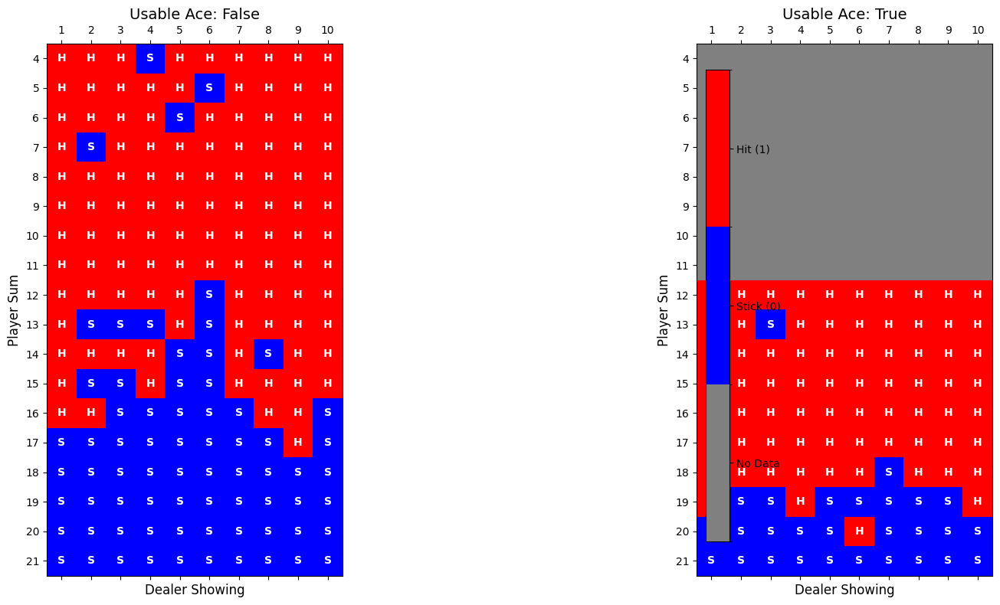

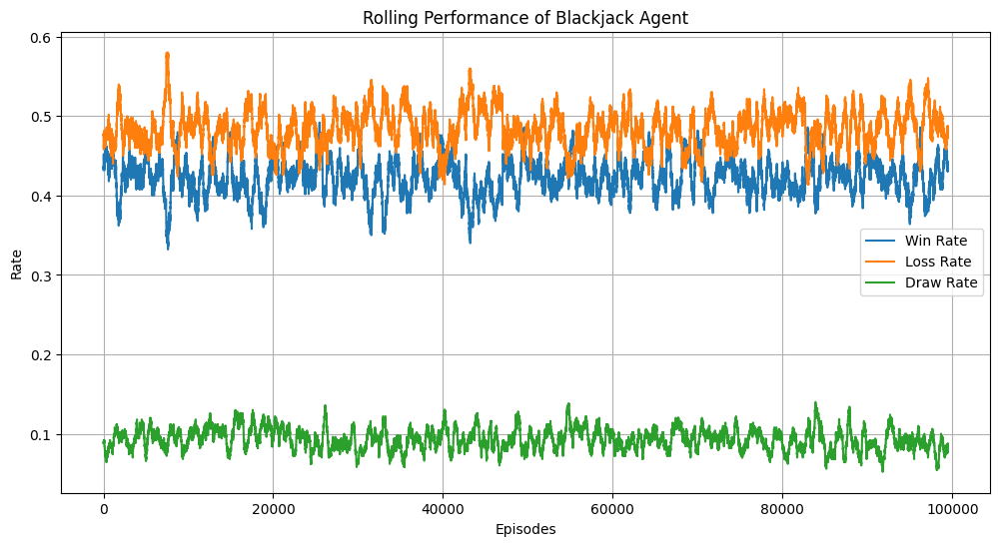

In [52]:
data = pd.DataFrame({
    'Win': [0],
    'Loss': [0],
    'Draw': [0],
    'W/L': [0.0],
    'Win rate': [0.0],
    'Net gain/loss': [0.0]
})

#data.set_index('ID', inplace=True)

# Train
initial_dep = 5000
bet = 1
q_table = train_agent()

# Evaluate
outcomes, outcome_history = evaluate_agent(q_table)
# data.at['Win'] = outcomes['win']
# data.at['Loss'] = outcomes['loss']
# data.at['Draw'] = outcomes['draw']
# data.at['W/L'] = outcomes['win'] / (outcomes['win'] + outcomes['loss'])
# data.at['Win rate'] = outcomes['win'] / (outcomes['win'] + outcomes['draw'] + outcomes['loss'])
# data.at['Net gain/loss'] = initial_dep + (outcomes['win'] * bet) - (outcomes['loss'] * bet)

plot_policy_single(q_table).show()
plot_outcomes_single(outcome_history, 500).show()
#plot_overall_results(data).show()

## Version 0.1 - Results and Conclusions

As it was our first model, we have not (unfortunately) included net gain/loss metric and we dont have the exact number's (we will have to read from the graph).<br>
Whenever win rate and loss rate lines are close - the model is performing better, whenever they are further apart, the model is losing much more than winning.<br>
We can quite confidentally say that the model is quite stable - win/loss/draw rates are oscilating around the same valus.<br>
The draws represent around 10% of the results, wins ~39-41% and the rest is the loss percentage.<br>
In terms of policy (when is the model hitting and when it is standing) from our domain knowledge we can conclude it performed decently - the shape of the strategy resembles 'perfect' strategy.<br>
There is one interesting, and quite risky policy that the model was sometimes hitting on 17+ - in terms of blackjack strategies this policy is simply wrong, however it is understandable and possible to explain by the fact that this is 'clear' version of the model.<br>
Additionally, the epsilon greedy approach (15% chance of random choice) can be possibly causing these anomalies.<br>
This is a great start and first version of the model and we will use it as a baseline for next versions.

# Version 0.2 - Reward-based strategy

In the second version we have decided to provide the model with the reference of strategy. We will be utilizing the Q_Learning_Agent and the 'perfect' strategy, which has been established by a group of blackjack enthusiasts and - with all blackjack actions available (i.e. splits, doubles and similar) - it reduces the houses edge to just 0.5%</br>
Since the GymAI environment does allow only 2 actions - hit and stand - we are expecting the winrate in the range from 42% to 48%.</br>
The tactic is always the same and never changes, therefore it has been hardcoded, and the Q_Learning_Agent is getting positive/negative rewards based on following the strategy (it is still making its own decisions but the incentive is set higher on the strategy). The training consists of 11 (0-10) iterations, where each iteration has an increased reward multiplier. The reward multiplier starts at 0, increases by 0.2 per iteration and serves as a supplement to the result of the game (f.x. 1.2 on first iteration - 1 (win) + 1 * 0.2 (correct strategy)).</br>
It is worth mentioning that we have found some academic paper in which on somewhat similar setup, where the academic team has reached 44% winrate and their model was converging (however, they were not using perfect strategy but a little bit simpler one).</br>
Lastly, we will run the Q_Learning_Agent on 500000 episodes so we should have decent amount of data and rule out any 'luck' in our games going on.</br>

In [53]:
class QLearningAgent:
    def __init__(self, action_space, alpha=0.1, gamma=0.99, epsilon=0.15):
        self.action_space = action_space
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.q_table = defaultdict(lambda: np.zeros(action_space.n))
    
    def select_action(self, state):
        if np.random.rand() < self.epsilon:
            return self.action_space.sample()
        else:
            return np.argmax(self.q_table[state])

    def update(self, state, action, reward, next_state, done):
        next_max = np.max(self.q_table[next_state]) if not done else 0
        old_value = self.q_table[state][action]
        self.q_table[state][action] = old_value + self.alpha * (reward + self.gamma * next_max - old_value)

In [54]:
def train_agent(episodes=500_000, reward_multiplier=0):
    env = create_environment(natural=True)
    agent = QLearningAgent(env.action_space)

    for ep in range(episodes):
        state, _ = env.reset()
        done = False

        while not done:
            action = agent.select_action(state)
            player_sum, dealer_card, has_usable_ace = state
            next_state, reward, done, truncated, info = env.step(action)
            reward += reward_system(state, action) * (reward_multiplier / 5)
            agent.update(state, action, reward, next_state, done)
            state = next_state

    return agent.q_table

def reward_system(state, action):
    player_sum, dealer_card, has_usable_ace = state
    if has_usable_ace == 0:
        # Dealer ace case - same as dealer 10
        if player_sum == 21:
            return -2 if action == 1 else 1
        elif player_sum >= 17:
            return -1 if action == 1 else 1
        elif 13 <= player_sum < 17:
            if 2 <= dealer_card <= 6:
                return -1 if action == 1 else 1
            else:
                return 1 if action == 1 else -1
        elif player_sum == 12:
            if 4 <= dealer_card <= 6:
                return -1 if action == 1 else 1
            else:
                return 1 if action == 1 else -1
        else:
            return 1 if action == 1 else -1
    else:
        if player_sum == 21:
            return -2 if action == 1 else 1
        elif player_sum >= 19:
            return -1 if action == 1 else 1
        elif player_sum == 18:
            if dealer_card < 9:
                return -1 if action == 1 else 1
            else:
                return 1 if action == 1 else -1
        elif player_sum < 18:
            return 1 if action == 1 else -1

C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\3000736438.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


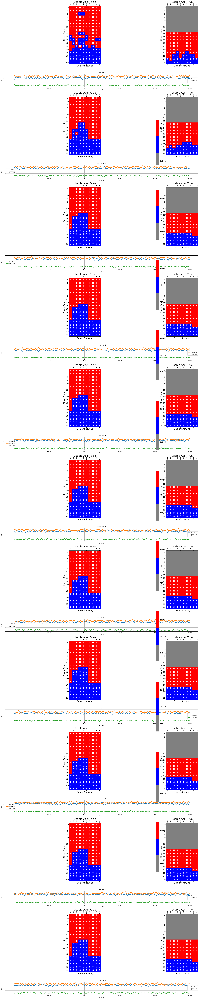

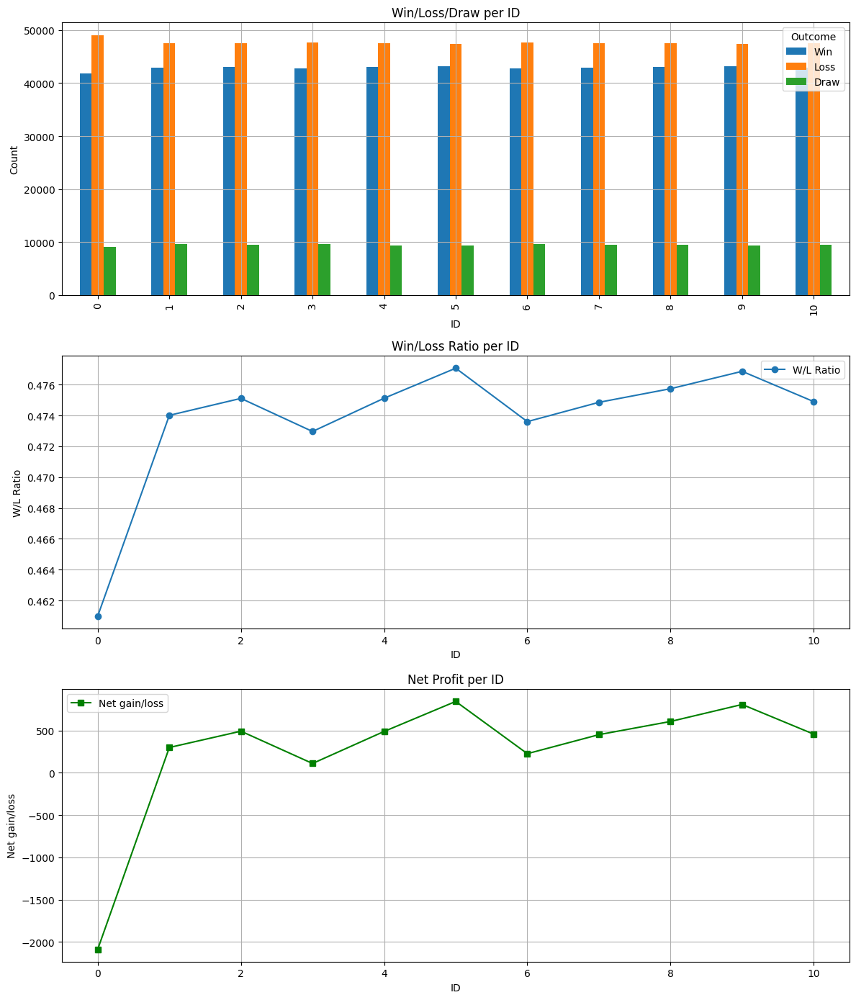

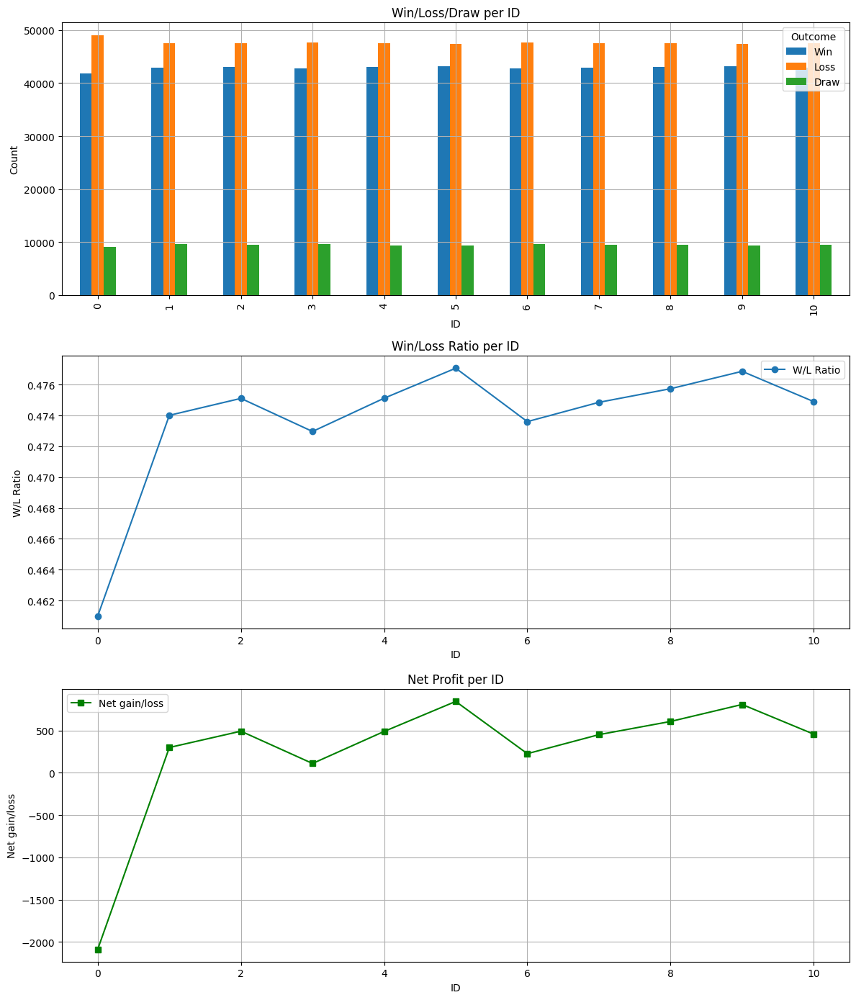

In [55]:
data = pd.DataFrame({
    'ID': range(11),
    'Win': [0]*11,
    'Loss': [0]*11,
    'Draw': [0]*11,
    'W/L': [0.0]*11,
    'Win rate': [0.0]*11,
    'Net gain/loss': [0.0]*11
})

data.set_index('ID', inplace=True)

fig = plt.figure(figsize=(24, 120))
gs = gridspec.GridSpec(44, 2, figure=fig)

# Train
for i in range(11):
    initial_dep = 5000
    bet = 1
    q_table = train_agent(reward_multiplier=i)

    # Evaluate
    outcomes, outcome_history = evaluate_agent(q_table)
    data.at[i, 'Win'] = outcomes['win']
    data.at[i, 'Loss'] = outcomes['loss']
    data.at[i, 'Draw'] = outcomes['draw']
    data.at[i, 'W/L'] = outcomes['win'] / (outcomes['win'] + outcomes['loss'])
    data.at[i, 'Win rate'] = outcomes['win'] / (outcomes['win'] + outcomes['draw'] + outcomes['loss'])
    data.at[i, 'Net gain/loss'] = initial_dep + (outcomes['win'] * bet) - (outcomes['loss'] * bet)
    
    # print(f"Base strat: {i/10}, Win/Loss Ratio: {outcomes['win']}/{outcomes['loss']}")
    # print(outcomes)

    # # Plot
    # plot_policy(q_table)
    # plot_outcomes(outcome_history, 500)
    row_start = i * 4
    ax1 = fig.add_subplot(gs[row_start:row_start+3, 0])
    ax2 = fig.add_subplot(gs[row_start:row_start+3, 1])
    ax_outcome = fig.add_subplot(gs[row_start+3, :])

    plot_policy(q_table, axs=[ax1, ax2])
    plot_outcomes(outcome_history, 500, ax=ax_outcome, title=f"Outcomes {i}")
plt.tight_layout()
plt.show()
plot_overall_results(data)

## Version 0.2 Results and Discussion

Looking at the policies diagrams, we can see that the model memorized the strategy very quickly:
- The first iteration shown no significant influence of the strategy (as expected, given the strategy reward had a 0 multiplier)
- The second iteration shown a very close resemblance to the perfect strategy, missing only 2 actions.
- Every next iteration (i.e. every iteration with reward multiplier over 0.2) completely memorized the pattern. This was an expected outcome, given the strategy is not complicated and the reward multiplier was high.

The Q_Learning_Agent started following the perfect strategy and achieved staggering 0.476 winrate.(47.6%)</br>
After converging at 4th iteration the model's winrate was between 0.474 and 0.476 (0.2% difference, explainable by random nature of the game itself)

The winrate falls within the expected range and proves the efficiency of strategy, seeing how little variance there is in the outcomes after first two iterations. One thing to be considered, however, is that the environment gives the same reward for the push as for the win.
The almost convergence of the model proves that the strategy is working and also highlights that perhaps, we could choose more complicated problem. (once again, blackjack might be surprisingly simple game)</br>

# Version 0.3 - Action-based strategy

With the version 0.3 we have decided to test full spectrum on possible base-strategy probability.</br>
We will still be using Q_Learning_Agent to test the 3rd approach using same algorithm.</br>
We have equipped the Q_Learning_Agent with much less strict 'base' strategy.</br>
It is essentially set of few actions that we would like the model to follow, since they are quite basic in terms of the game rules but few of our test models seemed to have problems with finding that trend (during our test runs the models were sometimes getting to the conclusion that it is good idea to HIT having 20 in hand).</br>
Similarily to the previous approach, the models will be given a "base-strategy-probability" parameter, increasing by 0.1 from 0 to 1.0 with each iteration, that will be used to provide a randomized decision when selecting an action to either use base strategy or action space sample/q_table. Given the increasing probability, each iteration the model will be more and more inclined to follow the strategy. </br>
Our expectations were that the model should sooner or later come cloose to the 'perfect' strategy on its own with the little help from the 'basic' one.</br>
According to the academic work of others - our winrate should be, again, in between 42% and 48% (most likely closer to the lower bound).</br>

In [56]:
class QLearningAgent:
    def __init__(self, action_space, alpha=0.1, gamma=0.99, epsilon=0.15, base_strategy_probability=0):
        self.action_space = action_space
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.base_strategy_probability = base_strategy_probability
        self.q_table = defaultdict(lambda: np.zeros(action_space.n))
    
    def select_action(self, state):
        if np.random.rand() < self.base_strategy_probability:
            return self.get_base_strategy_action(state)
        elif np.random.rand() < self.epsilon:
            return self.action_space.sample()
        else:
            return np.argmax(self.q_table[state])

    def update(self, state, action, reward, next_state, done):
        next_max = np.max(self.q_table[next_state]) if not done else 0
        old_value = self.q_table[state][action]
        self.q_table[state][action] = old_value + self.alpha * (reward + self.gamma * next_max - old_value)

    def get_base_strategy_action(self, state):
        player_sum, dealer_card, has_usable_ace = state

        if has_usable_ace == 1:
            if player_sum <= 17:
                return 1
            else:
                return 0
        else:
            if player_sum <= 11:
                return 1
            elif player_sum == 12 and 4 <= dealer_card <= 6:
                return 0
            elif 13 <= player_sum <= 16 and 2 <= dealer_card <= 6:
                return 0
            elif player_sum >= 17:
                return 0
            else:
                return 1

In [57]:
def train_agent(episodes=500_000, base_strategy_probability=0):
    env = create_environment(natural=True)
    agent = QLearningAgent(env.action_space, base_strategy_probability)

    for ep in range(episodes):
        state, _ = env.reset()
        done = False

        while not done:
            action = agent.select_action(state)
            player_sum, dealer_card, has_usable_ace = state
            next_state, reward, done, truncated, info = env.step(action)
            agent.update(state, action, reward, next_state, done)
            state = next_state

    return agent.q_table

C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\3340557802.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


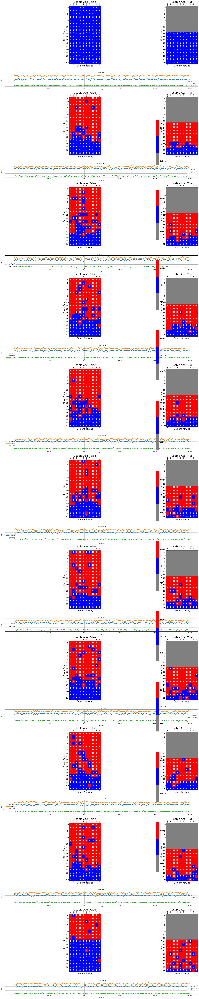

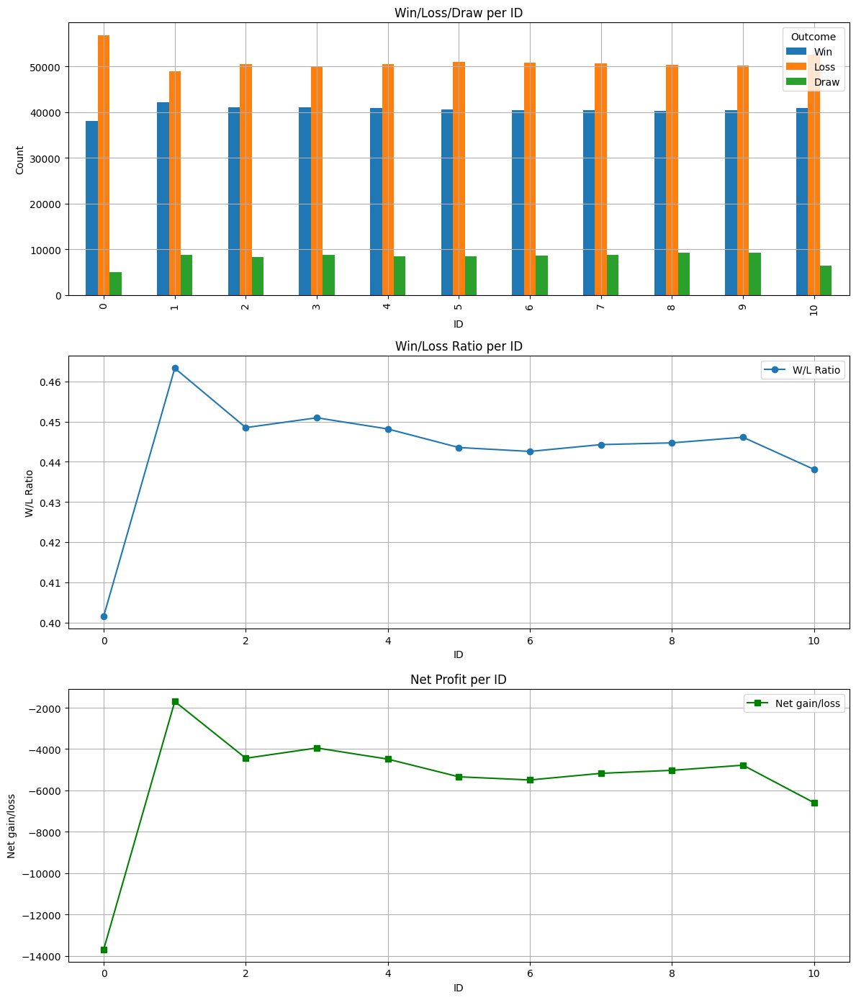

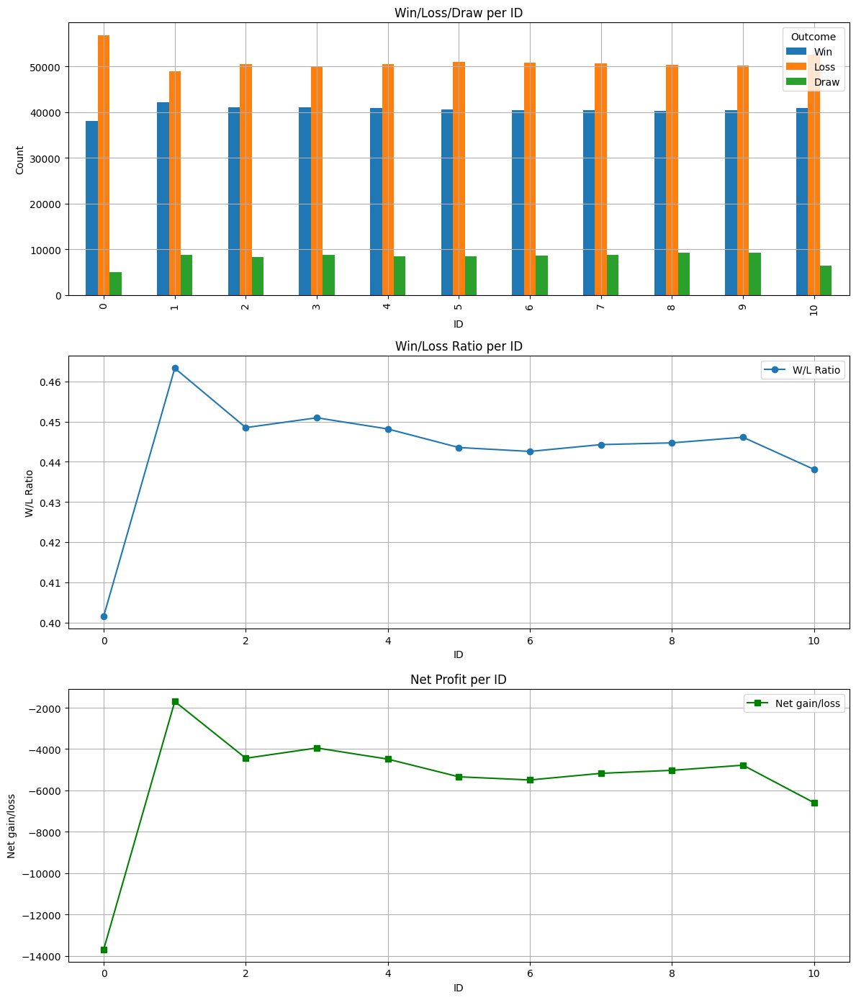

In [58]:
data = pd.DataFrame({
    'ID': range(11),
    'Win': [0]*11,
    'Loss': [0]*11,
    'Draw': [0]*11,
    'W/L': [0.0]*11,
    'Win rate': [0.0]*11,
    'Net gain/loss': [0.0]*11
})
data.set_index('ID', inplace=True)

fig = plt.figure(figsize=(24, 120))
gs = gridspec.GridSpec(44, 2, figure=fig)

for i in range(11):
    initial_dep = 5000
    bet = 1
    q_table = train_agent(base_strategy_probability=i/10)

    outcomes, outcome_history = evaluate_agent(q_table)
    data.at[i, 'Win'] = outcomes['win']
    data.at[i, 'Loss'] = outcomes['loss']
    data.at[i, 'Draw'] = outcomes['draw']
    data.at[i, 'W/L'] = outcomes['win'] / (outcomes['win'] + outcomes['loss'])
    data.at[i, 'Win rate'] = outcomes['win'] / (outcomes['win'] + outcomes['draw'] + outcomes['loss'])
    data.at[i, 'Net gain/loss'] = initial_dep + (outcomes['win'] * bet) - (outcomes['loss'] * bet)

    row_start = i * 4
    ax1 = fig.add_subplot(gs[row_start:row_start+3, 0])
    ax2 = fig.add_subplot(gs[row_start:row_start+3, 1])
    ax_outcome = fig.add_subplot(gs[row_start+3, :])

    plot_policy(q_table, axs=[ax1, ax2])
    plot_outcomes(outcome_history, 500, ax=ax_outcome, title=f"Outcomes {i}")

plt.tight_layout()
plt.show()

plot_overall_results(data)

## Version 0.3 - Results and Discussion

Firstly, let's take the look at the first iteration of the model.</br>
It is something that sometimes is happening to some our models.</br>
We cannot identify the issue (whether the model is that helpless on the first iteration or if the issue resides in our implementation).</br>
Our own metric that we implemented for the visualization Net gain/loss serves as the example of how our account would look like playing with this model's recommendations if we had 5000 currency at the start and bet 1 currency each hand.</br>
With that being said we can clearly see that the first iteration is terrible compared to the rest (~38% winrate and almost -14000 net loss).</br>
Immediately with next iterations the model gets back to work and is winning around 40% of hands and adding draws to it, the model seems to converge on around 45%.</br>
In the early iterations, the model tries various variations of mixing the decisions and learning interesting choices (especially in the cases where the player has 15 or less in the hand).</br>
With each iteration, the model is getting somewhat closer to the base strategy, where it plays more (i.e. more hits than in base strategy) and less (i.e. more stands than in base strategy) aggresively.</br>
Once again, the efficiency of the strategy can be seen in the first iteration, where the policy resembles the closest the base one, and the winrate is at peak amongst generations.
The performance of the model is slightly dissapointing to what we have seen so far, however it places itself within the reasonable bound of 42-48% (8-2% house edge which is reasonable given we have only to allowed actions in this environment).</br>

# Version 0.4 - SARSA Approach (State–action–reward–state–action)
#### IMPORTANT MENTION: it is likely useful to also have SMP as an elective course to understand more details about SARSA , however only half of our team was enrolled to it.</br>


Finally, after 3 versions we decided to change the algorithm.</br>
Firstly, we will go with SARSA (State–action–reward–state–action).</br>
Conceptually, the SARSA algorithm updates the Q-value for a given state-action pair, leading to an updated policy.</br>
SARSA is on-policy, meaning it learns from the current policy’s actions rather than optimizing actions through a model of the environment.</br>
SARSA Update Rule:</br>
- The core idea of SARSA is to update the Q-value for each state-action pair based on the actual experience (i.e., what the agent does while following its policy). The Q-value is updated using the Bellman Equation for SARSA.</br>


Since Q_Learning_Agent was <b>off-policy</b> it resulted in more stable convergence.</br>
Therefore, we were expecting that SARSA, because of being <b>on-policy</b>, can be more unstable and the model will have more 'freedom' to explore and adapt different policies.</br>
Also it may lead to greater variance in learning process.</br>

In [59]:
class SARSAAgent:
    def __init__(self, action_space, alpha=0.1, gamma=0.99, epsilon=0.15, base_strategy_probability=0):
        self.action_space = action_space
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.base_strategy_probability = base_strategy_probability
        self.q_table = defaultdict(lambda: np.zeros(action_space.n))
    
    def select_action(self, state):
        if np.random.rand() < self.base_strategy_probability:
            return self.get_base_strategy_action(state)
        elif np.random.rand() < self.epsilon:
            return self.action_space.sample()
        else:
            return np.argmax(self.q_table[state])

    def update(self, state, action, reward, next_state, next_action, done):
        next_value = self.q_table[next_state][next_action] if not done else 0        
        old_value = self.q_table[state][action]
        self.q_table[state][action] = old_value + self.alpha * (reward + self.gamma * next_value - old_value)

    def get_base_strategy_action(self, state):
        player_sum, dealer_card, has_usable_ace = state

        if has_usable_ace == 1:
            if player_sum <= 17:
                return 1
            else:
                return 0
        else:
            if player_sum <= 11:
                return 1
            elif player_sum == 12 and 4 <= dealer_card <= 6:
                return 0
            elif 13 <= player_sum <= 16 and 2 <= dealer_card <= 6:
                return 0
            elif player_sum >= 17:
                return 0
            else:
                return 1

In [60]:
def train_agent(episodes=500_000, base_strategy_probability=0):
    env = create_environment(natural=True)
    agent = SARSAAgent(env.action_space, base_strategy_probability)

    for ep in range(episodes):
        state, _ = env.reset()
        done = False
        action = agent.select_action(state)

        while not done:
            next_state, reward, done, truncated, info = env.step(action)
            if not done:
                next_action = agent.select_action(state)
                agent.update(state, action, reward, next_state, next_action, done)
                state = next_state
                action = next_action
            else:
                agent.update(state, action, reward, next_state, 0, done)

    return agent.q_table

C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\3340557802.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


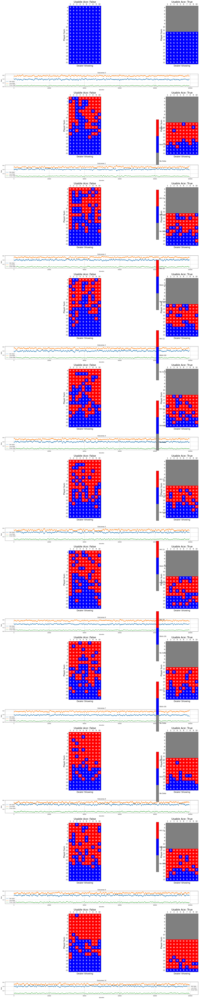

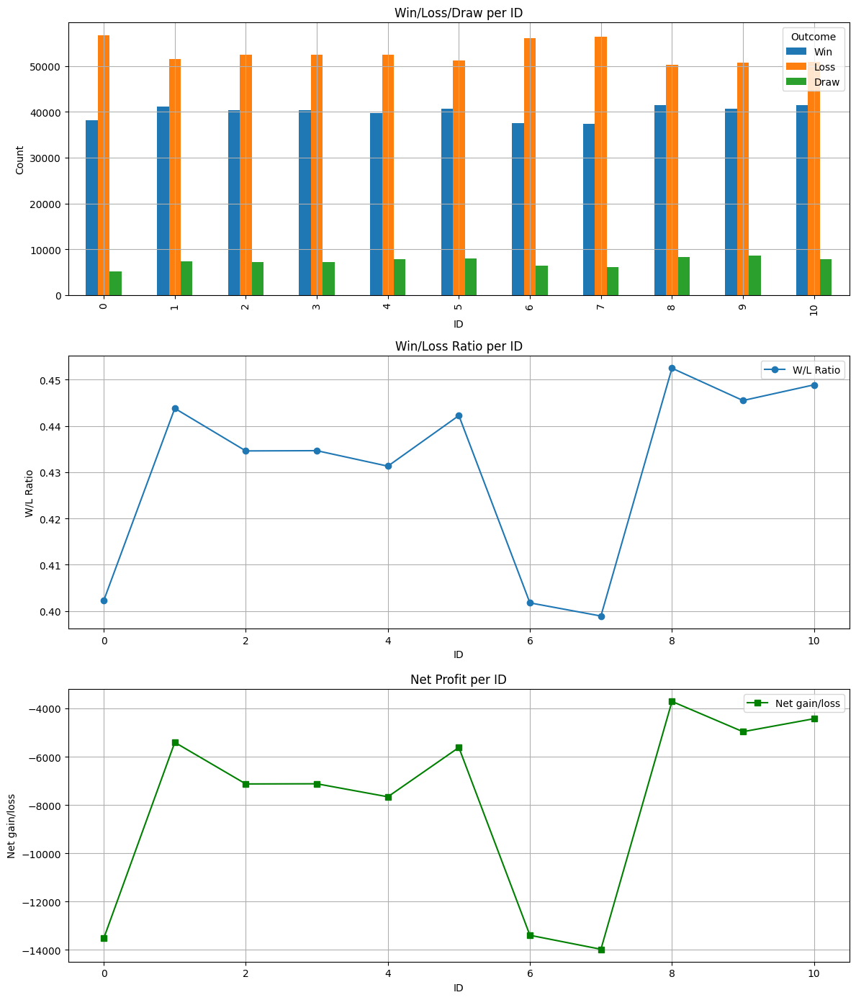

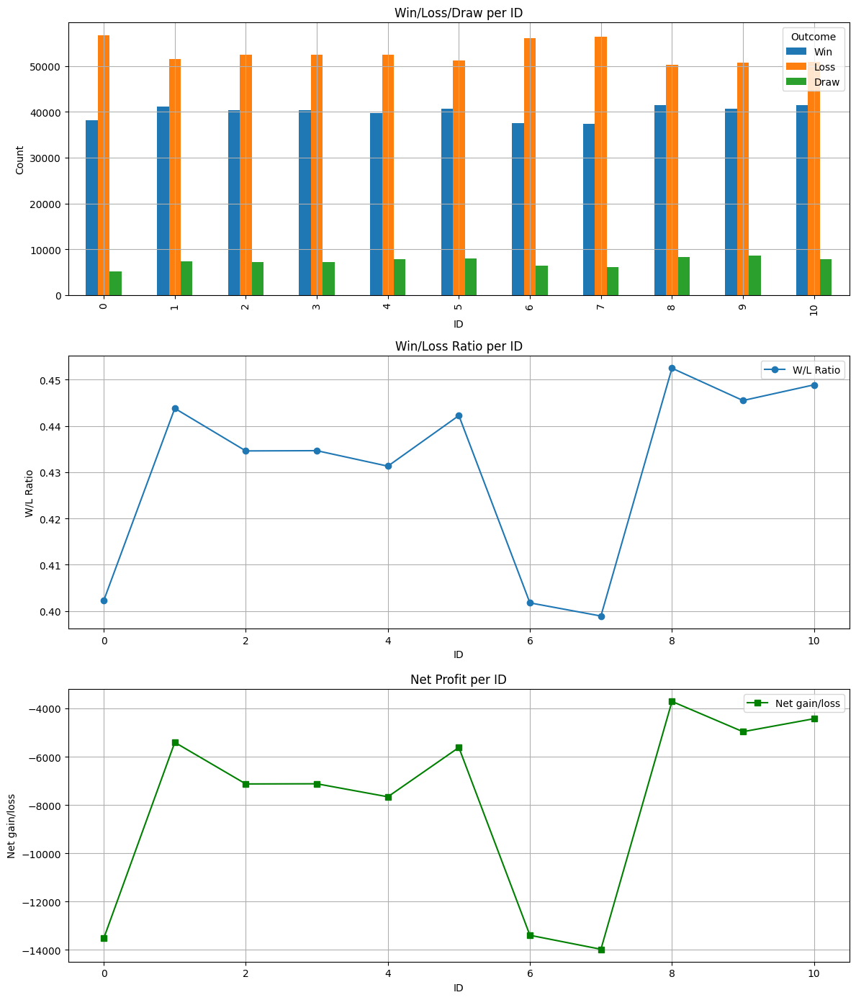

In [61]:
data = pd.DataFrame({
    'ID': range(11),
    'Win': [0]*11,
    'Loss': [0]*11,
    'Draw': [0]*11,
    'W/L': [0.0]*11,
    'Win rate': [0.0]*11,
    'Net gain/loss': [0.0]*11
})
data.set_index('ID', inplace=True)

fig = plt.figure(figsize=(24, 120))
gs = gridspec.GridSpec(44, 2, figure=fig)

for i in range(11):
    initial_dep = 5000
    bet = 1
    q_table = train_agent(base_strategy_probability=i/10)

    outcomes, outcome_history = evaluate_agent(q_table)
    data.at[i, 'Win'] = outcomes['win']
    data.at[i, 'Loss'] = outcomes['loss']
    data.at[i, 'Draw'] = outcomes['draw']
    data.at[i, 'W/L'] = outcomes['win'] / (outcomes['win'] + outcomes['loss'])
    data.at[i, 'Win rate'] = outcomes['win'] / (outcomes['win'] + outcomes['draw'] + outcomes['loss'])
    data.at[i, 'Net gain/loss'] = initial_dep + (outcomes['win'] * bet) - (outcomes['loss'] * bet)

    row_start = i * 4
    ax1 = fig.add_subplot(gs[row_start:row_start+3, 0])
    ax2 = fig.add_subplot(gs[row_start:row_start+3, 1])
    ax_outcome = fig.add_subplot(gs[row_start+3, :])

    plot_policy(q_table, axs=[ax1, ax2])
    plot_outcomes(outcome_history, 500, ax=ax_outcome, title=f"Outcomes {i}")

plt.tight_layout()
plt.show()

plot_overall_results(data)

## Version 0.4 - Results and Discussion

As mentioned earlier, we have experienced the issue with the first iteration (the reason is still uknown, sorry).</br>
However from next iterations, SARSA reinforcement model proved to be very interesting, ignoring the severe debt the model has accrued.</br>
The fluctuations in winrate varies from ~39% to ~45%. (still including draws as wins).</br>
The best iteration scored a little bit over ~45% resulting in the smallest net loss in the SARSA learning history.</br>
Mentioned instability is reflected by very 'liberal' choices the model was performing.</br>
The results are overlapping with our assumptions and come from on-policy nature of SARSA.</br>
Because of above mentioned technicalities, in few iterations the model came to the wrong (from human perspective illogical) conclusion to HIT on 19/20 hand in few scenarios.</br>
Overall, we deem SARSA implementation as very interesting and quite successful (it went according to the 'plan' and expectations that we drew from our understanding of this model).</br>

# Version 0.5 - Monte Carlo Policy

Lastly, we decided to go with Monte Carlo Policy (what better method to test than the one coming from the place famous for its casinos).</br>
Monte Carlo policy evaluation is a reinforcement learning technique that estimates the effectivness of a policy.</br>
It can be compared to learning the rules of a game by playing it many times rather than reading manual and than attempting to play it. (Monte Carlo policy evaluation is like trial-and-error learning method)</br>
The method works by running episodes where an agent interacts with the environment until it reaches a terminal state.</br>
At the end of each episode, the algorithm looks back at the states visited and the rewards received to calculate the 'return'.</br>
The return is cumulative reward for each episode.</br>
Here is the example on specific hand example:</br>
- for each state the player visits (exp. player (14), dealer(10), Ace: False) it will track the total rewards received after that specific state and average them over visiting it multiple times.</br>
- this is providing an estimation of how good that state is when following the model's current policy.</br>

Since Monte Carlo Policy requires complete episodes, it should work very well with Blackjack where every game (hand) has a clear beginning and end.</br>
This feature paired with the high number of episodes (500_000) set our expectations very high for this implementation.</br>
According to the theory, Monte Carlo Policy tends to struggle when episodes are large/complex and not clearly defined.</br>

In [62]:
class MonteCarloAgent:
    def __init__(self, action_space, gamma=0.99, epsilon=0.15):
        self.action_space = action_space
        self.gamma = gamma
        self.epsilon = epsilon
        self.q_table = defaultdict(lambda: np.zeros(action_space.n))
        self.returns_sum = defaultdict(lambda: np.zeros(action_space.n))
        self.returns_count = defaultdict(lambda: np.zeros(action_space.n))

    def select_action(self, state):
        if np.random.rand() < self.epsilon:
            return self.action_space.sample()
        else:
            return np.argmax(self.q_table[state])

    def update(self, episode):
        G = 0
        visited = set()

        for state, action, reward in reversed(episode):
            G = self.gamma * G + reward
            if (state, action) not in visited:
                visited.add((state, action))
                self.returns_sum[state][action] += G
                self.returns_count[state][action] += 1
                self.q_table[state][action] = self.returns_sum[state][action] / self.returns_count[state][action]

In [63]:
def train_agent(episodes=500_000):
    env = create_environment(natural=True)
    agent = MonteCarloAgent(env.action_space)

    for ep in range(episodes):
        episode = []
        state, _ = env.reset()
        done = False

        while not done:
            action = agent.select_action(state)
            next_state, reward, done, truncated, info = env.step(action)
            episode.append((state, action, reward))
            state = next_state

        agent.update(episode)

    return agent.q_table


C:\Users\iGor\AppData\Local\Temp\ipykernel_37372\3110533761.py:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


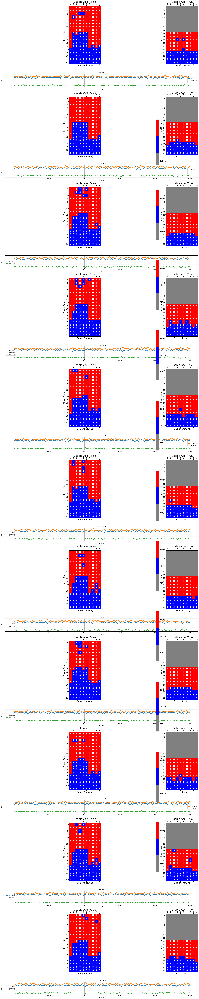

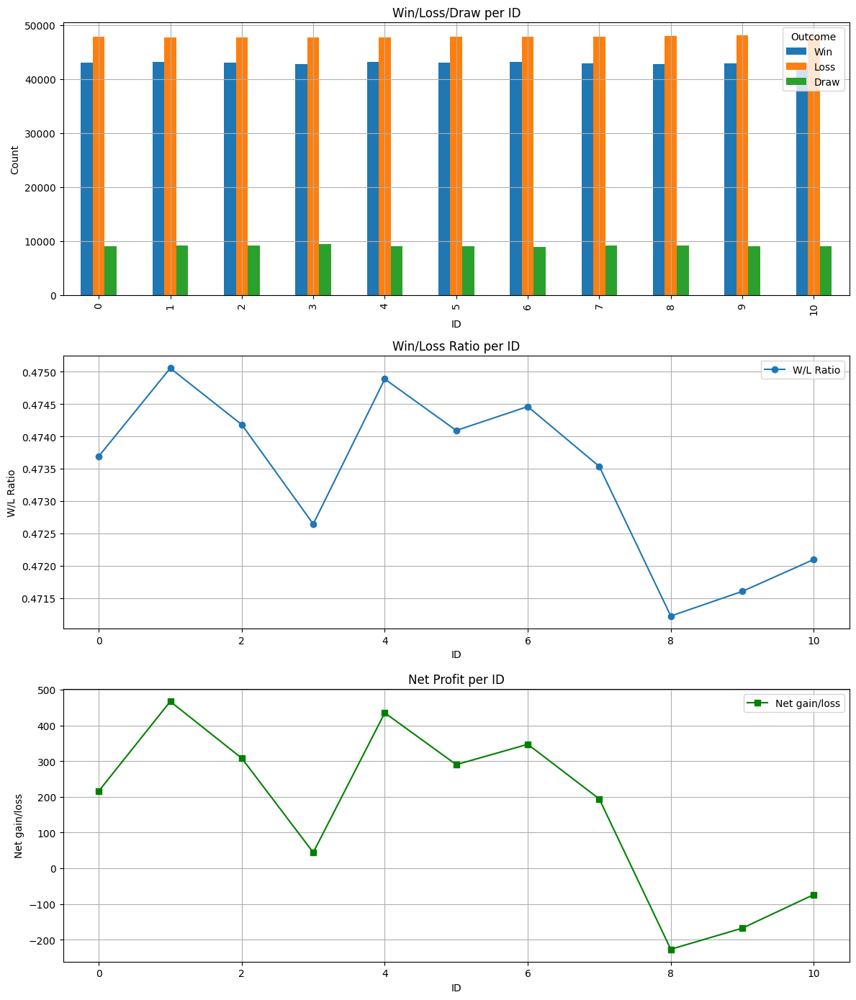

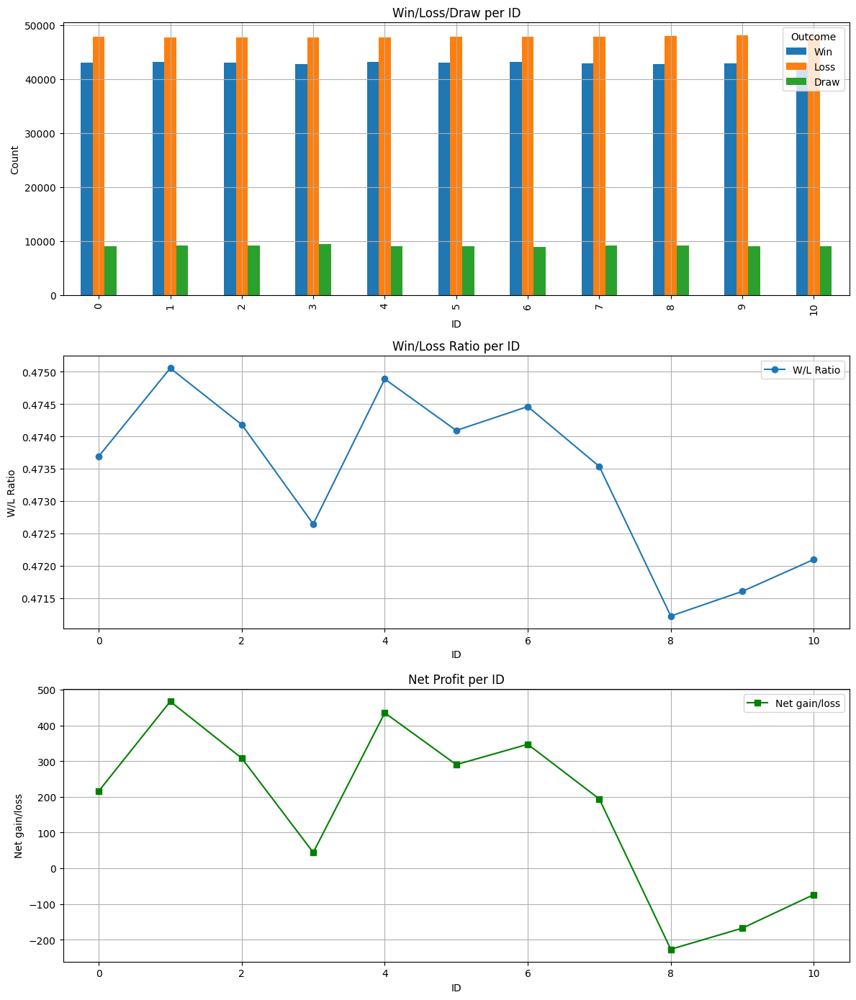

In [64]:
data = pd.DataFrame({
    'ID': range(11),
    'Win': [0]*11,
    'Loss': [0]*11,
    'Draw': [0]*11,
    'W/L': [0.0]*11,
    'Win rate': [0.0]*11,
    'Net gain/loss': [0.0]*11
})
data.set_index('ID', inplace=True)

fig = plt.figure(figsize=(24, 120))
gs = gridspec.GridSpec(44, 2, figure=fig)

for i in range(11):
    initial_dep = 5000
    bet = 1
    q_table = train_agent()

    outcomes, outcome_history = evaluate_agent(q_table)
    data.at[i, 'Win'] = outcomes['win']
    data.at[i, 'Loss'] = outcomes['loss']
    data.at[i, 'Draw'] = outcomes['draw']
    data.at[i, 'W/L'] = outcomes['win'] / (outcomes['win'] + outcomes['loss'])
    data.at[i, 'Win rate'] = outcomes['win'] / (outcomes['win'] + outcomes['draw'] + outcomes['loss'])
    data.at[i, 'Net gain/loss'] = initial_dep + (outcomes['win'] * bet) - (outcomes['loss'] * bet)

    row_start = i * 4
    ax1 = fig.add_subplot(gs[row_start:row_start+3, 0])
    ax2 = fig.add_subplot(gs[row_start:row_start+3, 1])
    ax_outcome = fig.add_subplot(gs[row_start+3, :])

    plot_policy(q_table, axs=[ax1, ax2])
    plot_outcomes(outcome_history, 500, ax=ax_outcome, title=f"Outcomes {i}")

plt.tight_layout()
plt.show()

plot_overall_results(data)


# Version 0.5 - Results and Conclusions

This time, with the 0th(first), we did not experience the issue with agent not learning, suggesting base strategy action implementation might be incorrect.</br>
We came to this conclusions since we experienced some problems with Monte Carlo Policy and we had to re-write it from scratch.</br>
Onto the Monte Carlo Policy's performance itself:</br>
- Since the model had no strategy or any instructions regarding the moves it is 'clear', book-like example of MC implementation.</br>
- The model was much more conservative (compared to for example SARSA) and from first iteration the policies were looking strikingly similar to the 'perfect strategy' charts (with some interesring variations)</br>
- This is our second best model (47.50% - we are still counting draws as wins) which is only 0.1% less than 'perfect' strategy.</br>
- Although W/L ratio look very unstable it is important to note that all data points are just different decimal points of 47%.</br>
- This means that the model is extremally stable and performs very consistently and very high.</br>
- Monte Carlo Policy is also very profitable according to our Net Profit metric.</br>
- This is the only model that had consistent net gain and over the course of 10 iteration it actually won money.</br>
- In the 'worst' case, the model lost 14000 in half a million hands and in MC Policy it is ~2000 in plus. (over 10 iterations - 5 millions hands playyed)</br>
- Interestingly, despite losing -2000 (in the first iteration - it must be bad luck :) ), the perfect strategy approach had ~2400 in the net gain metric.</br>

Monte Carlo Policy has also performed according to the expectations.</br>
Lastly, we think we could make it a little bit more book-like Monte Carlo implementation by implementing evaluation_agent.</br>
Technically it is not a requirement but it can be used to assess the performance of the train_agent AFTER it has been trained.</br>
The evaluation agent follows currently learned policy to measure winrate, which can provide with more accurate picture of the policy's effectiveness.</br>
In short: train_agent learns and evaluation_agent verifies the learning process.</br>
It seems that the policy named after the city housing one of the Europe's most prestigious casino performed the best at gambling and has the policies resembling the most the base strategy without any incentive.
Monte Carlo Policy is a very interesting approach and we are generally satisfied with its results.</br>

# Afterword

We have explored various models and learning approaches.</br>
When we started working on the Blackjack project we were a little bit concerned that it will not be interesting or complex enough due to the game's simplicity and the fact that it is 'solved' (the mathematically perfected solution exist).</br>
We managed to have brought out the depth of this concept by juggling with different combinations of strategies/no strategies and choice of agents.</br>
This was very interesting project and we are generally happy with it's learning process and our academic development.</br>